In [96]:
import anndata as ad
import gc
import sys
from scipy.sparse import csc_matrix
from sklearn.model_selection import train_test_split
from sklearn.decomposition import TruncatedSVD
from sklearn.linear_model import LinearRegression
import random
import numpy as np
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt
import pickle
import heapq
import matplotlib
import os
import umap
# import umap.umap_ as umap
from sklearn.decomposition import PCA
from numpy import linalg as LA
from tqdm import tqdm
import pandas as pd
import seaborn as sns
import sklearn

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
random.seed(1)
np.random.seed(1)
torch.manual_seed(1)

batch_size = 50000
pred_start = 1
pred_end = 2

cuda


In [5]:
train_mod1_file = 'phase2_private_data/predict_modality/openproblems_bmmc_cite_phase2_rna/openproblems_bmmc_cite_phase2_rna.censor_dataset.output_train_mod1.h5ad'
train_mod2_file = 'phase2_private_data/predict_modality/openproblems_bmmc_cite_phase2_rna/openproblems_bmmc_cite_phase2_rna.censor_dataset.output_train_mod2.h5ad'
test_mod1_file = 'phase2_private_data/predict_modality/openproblems_bmmc_cite_phase2_rna/openproblems_bmmc_cite_phase2_rna.censor_dataset.output_test_mod1.h5ad'
test_mod2_file = 'phase2_private_data/predict_modality/openproblems_bmmc_cite_phase2_rna/openproblems_bmmc_cite_phase2_rna.censor_dataset.output_test_mod2.h5ad'

In [6]:
input_train_mod1 = ad.read_h5ad(train_mod1_file)
input_train_mod2 = ad.read_h5ad(train_mod2_file)
input_test_mod1 = ad.read_h5ad(test_mod1_file)
input_test_mod2 = ad.read_h5ad(test_mod2_file)

In [7]:
print(input_train_mod1)
print(input_train_mod2)
print(input_test_mod1)
print(input_test_mod2)

AnnData object with n_obs × n_vars = 66175 × 13953
    obs: 'batch', 'size_factors'
    var: 'gene_ids', 'feature_types'
    uns: 'dataset_id', 'organism'
    layers: 'counts'
AnnData object with n_obs × n_vars = 66175 × 134
    obs: 'batch', 'size_factors'
    var: 'feature_types'
    uns: 'dataset_id', 'organism'
    layers: 'counts'
AnnData object with n_obs × n_vars = 1000 × 13953
    obs: 'batch', 'size_factors'
    var: 'gene_ids', 'feature_types'
    uns: 'dataset_id', 'organism'
    layers: 'counts'
AnnData object with n_obs × n_vars = 1000 × 134
    obs: 'batch', 'size_factors'
    var: 'feature_types'
    uns: 'dataset_id', 'organism'
    layers: 'counts'


In [8]:
print(sorted(set(input_train_mod1.obs['batch'])))
print(sorted(set(input_train_mod2.obs['batch'])))

['s1d1', 's1d2', 's1d3', 's2d1', 's2d4', 's2d5', 's3d1', 's3d6', 's3d7']
['s1d1', 's1d2', 's1d3', 's2d1', 's2d4', 's2d5', 's3d1', 's3d6', 's3d7']


In [9]:
print(sorted(set(input_test_mod1.obs['batch'])))
print(sorted(set(input_test_mod2.obs['batch'])))

['s4d1', 's4d8', 's4d9']
['s4d1', 's4d8', 's4d9']


In [10]:
RNA_s1d1 = input_train_mod1[input_train_mod1.obs["batch"] == "s1d1", :]
RNA_s1d2 = input_train_mod1[input_train_mod1.obs["batch"] == "s1d2", :]
RNA_s1d3 = input_train_mod1[input_train_mod1.obs["batch"] == "s1d3", :]
RNA_s2d1 = input_train_mod1[input_train_mod1.obs["batch"] == "s2d1", :]
RNA_s2d4 = input_train_mod1[input_train_mod1.obs["batch"] == "s2d4", :]
RNA_s2d5 = input_train_mod1[input_train_mod1.obs["batch"] == "s2d5", :]

RNA_s3d1 = input_train_mod1[input_train_mod1.obs["batch"] == "s3d1", :]
RNA_s3d6 = input_train_mod1[input_train_mod1.obs["batch"] == "s3d6", :]
RNA_s3d7 = input_train_mod1[input_train_mod1.obs["batch"] == "s3d7", :]

In [11]:
pro_s1d1 = input_train_mod2[input_train_mod2.obs["batch"] == "s1d1", :]
pro_s1d2 = input_train_mod2[input_train_mod2.obs["batch"] == "s1d2", :]
pro_s1d3 = input_train_mod2[input_train_mod2.obs["batch"] == "s1d3", :]
pro_s2d1 = input_train_mod2[input_train_mod2.obs["batch"] == "s2d1", :]
pro_s2d4 = input_train_mod2[input_train_mod2.obs["batch"] == "s2d4", :]
pro_s2d5 = input_train_mod2[input_train_mod2.obs["batch"] == "s2d5", :]

pro_s3d1 = input_train_mod2[input_train_mod2.obs["batch"] == "s3d1", :]
pro_s3d6 = input_train_mod2[input_train_mod2.obs["batch"] == "s3d6", :]
pro_s3d7 = input_train_mod2[input_train_mod2.obs["batch"] == "s3d7", :]

In [12]:
RNA_s4d1 = input_test_mod1[input_test_mod1.obs["batch"] == "s4d1", :]
RNA_s4d8 = input_test_mod1[input_test_mod1.obs["batch"] == "s4d8", :]
RNA_s4d9 = input_test_mod1[input_test_mod1.obs["batch"] == "s4d9", :]

In [13]:
pro_s4d1 = input_test_mod2[input_test_mod2.obs["batch"] == "s4d1", :]
pro_s4d8 = input_test_mod2[input_test_mod2.obs["batch"] == "s4d8", :]
pro_s4d9 = input_test_mod2[input_test_mod2.obs["batch"] == "s4d9", :]

In [14]:
RNA_s1d1 = RNA_s1d1.X.toarray()
RNA_s1d2 = RNA_s1d2.X.toarray()
RNA_s1d3 = RNA_s1d3.X.toarray()
RNA_s2d1 = RNA_s2d1.X.toarray()
RNA_s2d4 = RNA_s2d4.X.toarray()
RNA_s2d5 = RNA_s2d5.X.toarray()

RNA_s3d1 = RNA_s3d1.X.toarray()
RNA_s3d6 = RNA_s3d6.X.toarray()
RNA_s3d7 = RNA_s3d7.X.toarray()

In [15]:
pro_s1d1 = pro_s1d1.X.toarray()[:, pred_start:pred_end]
pro_s1d2 = pro_s1d2.X.toarray()[:, pred_start:pred_end]
pro_s1d3 = pro_s1d3.X.toarray()[:, pred_start:pred_end]
pro_s2d1 = pro_s2d1.X.toarray()[:, pred_start:pred_end]
pro_s2d4 = pro_s2d4.X.toarray()[:, pred_start:pred_end]
pro_s2d5 = pro_s2d5.X.toarray()[:, pred_start:pred_end]

pro_s3d1 = pro_s3d1.X.toarray()[:, pred_start:pred_end]
pro_s3d6 = pro_s3d6.X.toarray()[:, pred_start:pred_end]
pro_s3d7 = pro_s3d7.X.toarray()[:, pred_start:pred_end]

In [16]:
RNA_s4d1 = RNA_s4d1.X.toarray()
RNA_s4d8 = RNA_s4d8.X.toarray()
RNA_s4d9 = RNA_s4d9.X.toarray()

In [17]:
pro_s4d1 = pro_s4d1.X.toarray()[:, pred_start:pred_end]
pro_s4d8 = pro_s4d8.X.toarray()[:, pred_start:pred_end]
pro_s4d9 = pro_s4d9.X.toarray()[:, pred_start:pred_end]

In [18]:
print(RNA_s1d1.shape)
print(pro_s1d1.shape)

(4721, 13953)
(4721, 1)


In [19]:
batch_s1d1 = input_train_mod1[input_train_mod1.obs["batch"] == "s1d1", :].obs["batch"]
batch_s1d2 = input_train_mod1[input_train_mod1.obs["batch"] == "s1d2", :].obs["batch"]
batch_s1d3 = input_train_mod1[input_train_mod1.obs["batch"] == "s1d3", :].obs["batch"]
batch_s2d1 = input_train_mod1[input_train_mod1.obs["batch"] == "s2d1", :].obs["batch"]
batch_s2d4 = input_train_mod1[input_train_mod1.obs["batch"] == "s2d4", :].obs["batch"]
batch_s2d5 = input_train_mod1[input_train_mod1.obs["batch"] == "s2d5", :].obs["batch"]

batch_s3d1 = input_train_mod1[input_train_mod1.obs["batch"] == "s3d1", :].obs["batch"]
batch_s3d6 = input_train_mod1[input_train_mod1.obs["batch"] == "s3d6", :].obs["batch"]
batch_s3d7 = input_train_mod1[input_train_mod1.obs["batch"] == "s3d7", :].obs["batch"]

batch_s4d1 = input_test_mod1[input_test_mod1.obs["batch"] == "s4d1", :].obs["batch"]
batch_s4d8 = input_test_mod1[input_test_mod1.obs["batch"] == "s4d8", :].obs["batch"]
batch_s4d9 = input_test_mod1[input_test_mod1.obs["batch"] == "s4d9", :].obs["batch"]

In [20]:
# batch_train = list(batch_s1d1)+list(batch_s1d2)+list(batch_s1d3)+list(batch_s2d1)+list(batch_s2d4)+list(batch_s2d5)
# batch_val = list(batch_s3d1)+list(batch_s3d6)+list(batch_s3d7)
# batch_test = list(batch_s4d1)+list(batch_s4d8)+list(batch_s4d9)

In [21]:
# train_input = [RNA_s1d1, RNA_s1d2, RNA_s1d3, RNA_s2d1, RNA_s2d4, RNA_s2d5]
# train_output = [pro_s1d1, pro_s1d2, pro_s1d3, pro_s2d1, pro_s2d4, pro_s2d5]

# val_input = [RNA_s3d1, RNA_s3d6, RNA_s3d7]
# val_output = [pro_s3d1, pro_s3d6, pro_s3d7]

# test_input = [RNA_s4d1, RNA_s4d8, RNA_s4d9]
# test_output = [pro_s4d1, pro_s4d8, pro_s4d9]

In [22]:
# train_input = train_input + val_input
# train_output = train_output + val_output

In [23]:
# train_input = np.concatenate(train_input, axis=0)
# val_input = np.concatenate(val_input, axis=0)
# test_input = np.concatenate(test_input, axis=0)

# train_output = np.concatenate(train_output, axis=0)
# val_output = np.concatenate(val_output, axis=0)
# test_output = np.concatenate(test_output, axis=0)

In [24]:
test_input = [RNA_s4d1, RNA_s4d8, RNA_s4d9]
test_output = [pro_s4d1, pro_s4d8, pro_s4d9]

test_input = np.concatenate(test_input, axis=0)
test_output = np.concatenate(test_output, axis=0)

In [25]:
print(test_input.shape)
print(test_output.shape)

(1000, 13953)
(1000, 1)


In [26]:
RNA_s1d1 = torch.from_numpy(RNA_s1d1)
RNA_s1d2 = torch.from_numpy(RNA_s1d2)
RNA_s1d3 = torch.from_numpy(RNA_s1d3)
RNA_s2d1 = torch.from_numpy(RNA_s2d1)
RNA_s2d4 = torch.from_numpy(RNA_s2d4)
RNA_s2d5 = torch.from_numpy(RNA_s2d5)
RNA_s3d1 = torch.from_numpy(RNA_s3d1)
RNA_s3d6 = torch.from_numpy(RNA_s3d6)
RNA_s3d7 = torch.from_numpy(RNA_s3d7)
RNA_s4d1 = torch.from_numpy(RNA_s4d1)
RNA_s4d8 = torch.from_numpy(RNA_s4d8)
RNA_s4d9 = torch.from_numpy(RNA_s4d9)

In [27]:
pro_s1d1 = torch.from_numpy(pro_s1d1)
pro_s1d2 = torch.from_numpy(pro_s1d2)
pro_s1d3 = torch.from_numpy(pro_s1d3)
pro_s2d1 = torch.from_numpy(pro_s2d1)
pro_s2d4 = torch.from_numpy(pro_s2d4)
pro_s2d5 = torch.from_numpy(pro_s2d5)
pro_s3d1 = torch.from_numpy(pro_s3d1)
pro_s3d6 = torch.from_numpy(pro_s3d6)
pro_s3d7 = torch.from_numpy(pro_s3d7)
pro_s4d1 = torch.from_numpy(pro_s4d1)
pro_s4d8 = torch.from_numpy(pro_s4d8)
pro_s4d9 = torch.from_numpy(pro_s4d9)

In [28]:
test_input = torch.from_numpy(test_input)
test_output = torch.from_numpy(test_output)

In [29]:
RNA_s1d1 = RNA_s1d1.float()
RNA_s1d2 = RNA_s1d2.float()
RNA_s1d3 = RNA_s1d3.float()
RNA_s2d1 = RNA_s2d1.float()
RNA_s2d4 = RNA_s2d4.float()
RNA_s2d5 = RNA_s2d5.float()
RNA_s3d1 = RNA_s3d1.float()
RNA_s3d6 = RNA_s3d6.float()
RNA_s3d7 = RNA_s3d7.float()
RNA_s4d1 = RNA_s4d1.float()
RNA_s4d8 = RNA_s4d8.float()
RNA_s4d9 = RNA_s4d9.float()

pro_s1d1 = pro_s1d1.float()
pro_s1d2 = pro_s1d2.float()
pro_s1d3 = pro_s1d3.float()
pro_s2d1 = pro_s2d1.float()
pro_s2d4 = pro_s2d4.float()
pro_s2d5 = pro_s2d5.float()
pro_s3d1 = pro_s3d1.float()
pro_s3d6 = pro_s3d6.float()
pro_s3d7 = pro_s3d7.float()
pro_s4d1 = pro_s4d1.float()
pro_s4d8 = pro_s4d8.float()
pro_s4d9 = pro_s4d9.float()

In [30]:
test_input = test_input.float()
test_output = test_output.float()

In [31]:
RNA_s1d1 = RNA_s1d1.to(device)
RNA_s1d2 = RNA_s1d2.to(device)
RNA_s1d3 = RNA_s1d3.to(device)
RNA_s2d1 = RNA_s2d1.to(device)
RNA_s2d4 = RNA_s2d4.to(device)
RNA_s2d5 = RNA_s2d5.to(device)
RNA_s3d1 = RNA_s3d1.to(device)
RNA_s3d6 = RNA_s3d6.to(device)
RNA_s3d7 = RNA_s3d7.to(device)
RNA_s4d1 = RNA_s4d1.to(device)
RNA_s4d8 = RNA_s4d8.to(device)
RNA_s4d9 = RNA_s4d9.to(device)

pro_s1d1 = pro_s1d1.to(device)
pro_s1d2 = pro_s1d2.to(device)
pro_s1d3 = pro_s1d3.to(device)
pro_s2d1 = pro_s2d1.to(device)
pro_s2d4 = pro_s2d4.to(device)
pro_s2d5 = pro_s2d5.to(device)
pro_s3d1 = pro_s3d1.to(device)
pro_s3d6 = pro_s3d6.to(device)
pro_s3d7 = pro_s3d7.to(device)
pro_s4d1 = pro_s4d1.to(device)
pro_s4d8 = pro_s4d8.to(device)
pro_s4d9 = pro_s4d9.to(device)

In [32]:
test_input = test_input.to(device)
test_output = test_output.to(device)

In [33]:
input_feature = RNA_s1d1.shape[1]
# output_feature = pred_num

In [34]:
# auto-encoder model
# base model
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        self.linear1 = nn.Linear(input_feature, 3)
        self.linear2 = nn.Linear(input_feature//2, input_feature//4)
        self.linear3 = nn.Linear(input_feature//4, input_feature//8)
        self.linear4 = nn.Linear(input_feature//8, input_feature//16)
        
        self.linear5 = nn.Linear(3, 1)
        self.relu = nn.ReLU()
        self.leakyrelu = nn.LeakyReLU(0.1)
        self.dropout = nn.Dropout(0.15)
        
        self.linear = nn.Linear(input_feature, 1)

    def forward(self, x):
        x = self.linear1(x)
        emb = self.relu(x)
        
        output = self.linear5(emb)
        
        return output.float(), emb

In [35]:
PATH = 'No_norm_model_RNA_pro'

In [36]:
num_epochs = 2001
losses = np.zeros((9, 12, num_epochs))

In [37]:
def fit(num_epochs, model, loss_fn, RNA, pro, train_batch_name, train_index):
    train_ds = TensorDataset(RNA, pro)
    train_dl = DataLoader(train_ds, batch_size= batch_size, shuffle=True)
    val_best = float('inf')
    train_pred_output = []
    val_pred_output = []
        
    for epoch in range(num_epochs):
        for x,y in train_dl:
            model = model.train()
            pred, emb = model(x)
            loss = loss_fn(pred, y)
            loss.backward()
            opt.step()
            opt.zero_grad()

        if epoch % 1 == 0:
            model = model.eval()
                
            s1d1_pred, s1d1_emb = model(RNA_s1d1)
            s1d1_loss = loss_fn(s1d1_pred, pro_s1d1)
            s1d1_loss = torch.sqrt(s1d1_loss)
            s1d1_loss = s1d1_loss.cpu().detach().numpy()
            
            s1d2_pred, s1d2_emb = model(RNA_s1d2)
            s1d2_loss = loss_fn(s1d2_pred, pro_s1d2)
            s1d2_loss = torch.sqrt(s1d2_loss)
            s1d2_loss = s1d2_loss.cpu().detach().numpy()
            
            s1d3_pred, s1d3_emb = model(RNA_s1d3)
            s1d3_loss = loss_fn(s1d3_pred, pro_s1d3)
            s1d3_loss = torch.sqrt(s1d3_loss)
            s1d3_loss = s1d3_loss.cpu().detach().numpy()
            
            s2d1_pred, s2d1_emb = model(RNA_s2d1)
            s2d1_loss = loss_fn(s2d1_pred, pro_s2d1)
            s2d1_loss = torch.sqrt(s2d1_loss)
            s2d1_loss = s2d1_loss.cpu().detach().numpy()
            
            s2d4_pred, s2d4_emb = model(RNA_s2d4)
            s2d4_loss = loss_fn(s2d4_pred, pro_s2d4)
            s2d4_loss = torch.sqrt(s2d4_loss)
            s2d4_loss = s2d4_loss.cpu().detach().numpy()
            
            s2d5_pred, s2d5_emb = model(RNA_s2d5)
            s2d5_loss = loss_fn(s2d5_pred, pro_s2d5)
            s2d5_loss = torch.sqrt(s2d5_loss)
            s2d5_loss = s2d5_loss.cpu().detach().numpy()
            
            s3d1_pred, s3d1_emb = model(RNA_s3d1)
            s3d1_loss = loss_fn(s3d1_pred, pro_s3d1)
            s3d1_loss = torch.sqrt(s3d1_loss)
            s3d1_loss = s3d1_loss.cpu().detach().numpy()
            
            s3d6_pred, s3d6_emb = model(RNA_s3d6)
            s3d6_loss = loss_fn(s3d6_pred, pro_s3d6)
            s3d6_loss = torch.sqrt(s3d6_loss)
            s3d6_loss = s3d6_loss.cpu().detach().numpy()
            
            s3d7_pred, s3d7_emb = model(RNA_s3d7)
            s3d7_loss = loss_fn(s3d7_pred, pro_s3d7)
            s3d7_loss = torch.sqrt(s3d7_loss)
            s3d7_loss = s3d7_loss.cpu().detach().numpy()

            s4d1_pred, s4d1_emb = model(RNA_s4d1)
            s4d1_loss = loss_fn(s4d1_pred, pro_s4d1)
            s4d1_loss = torch.sqrt(s4d1_loss)
            s4d1_loss = s4d1_loss.cpu().detach().numpy()
            
            s4d8_pred, s4d8_emb = model(RNA_s4d8)
            s4d8_loss = loss_fn(s4d8_pred, pro_s4d8)
            s4d8_loss = torch.sqrt(s4d8_loss)
            s4d8_loss = s4d8_loss.cpu().detach().numpy()
            
            s4d9_pred, s4d9_emb = model(RNA_s4d9)
            s4d9_loss = loss_fn(s4d9_pred, pro_s4d9)
            s4d9_loss = torch.sqrt(s4d9_loss)
            s4d9_loss = s4d9_loss.cpu().detach().numpy()
            
            test_pred, test_emb = model(test_input)
            test_loss = loss_fn(test_pred, test_output)
            test_loss = torch.sqrt(test_loss)
            test_loss = test_loss.cpu().detach().numpy()
            
            cal_test_loss = ((s4d1_loss**2*s4d1_pred.shape[0] + s4d8_loss**2*s4d8_pred.shape[0] + s4d9_loss**2*s4d9_pred.shape[0])/(s4d1_pred.shape[0]+s4d8_pred.shape[0]+s4d9_pred.shape[0]))**0.5
            # print('Epoch ', epoch, 's1d1: ', s1d1_loss, 's1d2: ', s1d2_loss, 's1d3: ', s1d3_loss, 's2d1:', s2d1_loss, 's2d4:',
            #     s2d4_loss, 's2d5:', s2d5_loss, 's3d1:', s3d1_loss, 's3d6:', s3d6_loss, 's3d7:', s3d7_loss, 's4d1:', s4d1_loss, 's4d8:', 
            #       s4d8_loss, 's4d9:', s4d9_loss, 'test:', test_loss, 'calc test:', cal_test_loss)
            
            losses_temp = [s1d1_loss, s1d2_loss, s1d3_loss, s2d1_loss, s2d4_loss, s2d5_loss, s3d1_loss, s3d6_loss, s3d7_loss, s4d1_loss, s4d8_loss, s4d9_loss]
            for j in range(len(losses_temp)):
                losses[train_index, j, epoch] = losses_temp[j]
            
        batches = ['s1d1', 's1d2', 's1d3', 's2d1', 's2d4', 's2d5', 's3d1', 's3d6', 's3d7', 's4d1', 's4d8', 's4d9']
        
        batches_emb_pred = [s1d1_emb.cpu().detach().numpy(), s1d2_emb.cpu().detach().numpy(), s1d3_emb.cpu().detach().numpy(), s2d1_emb.cpu().detach().numpy(), s2d4_emb.cpu().detach().numpy(), 
                s2d5_emb.cpu().detach().numpy(), s3d1_emb.cpu().detach().numpy(), s3d6_emb.cpu().detach().numpy(), s3d7_emb.cpu().detach().numpy(), s4d1_emb.cpu().detach().numpy(), 
                s4d8_emb.cpu().detach().numpy(), s4d9_emb.cpu().detach().numpy()]
        
        if epoch == 1999:
            path = train_batch_name
            try:
                os.mkdir(path)
            except OSError as error:
                print(error)  
            for i in range(len(batches)):
                filehandler = open(train_batch_name + '/' + batches[i] + '.pickle', "wb")
                pickle.dump(batches_emb_pred[i], filehandler)
                filehandler.close()
                
        batches_pred = [s1d1_pred.cpu().detach().numpy(), s1d2_pred.cpu().detach().numpy(), s1d3_pred.cpu().detach().numpy(), s2d1_pred.cpu().detach().numpy(), s2d4_pred.cpu().detach().numpy(), 
                        s2d5_pred.cpu().detach().numpy(), s3d1_pred.cpu().detach().numpy(), s3d6_pred.cpu().detach().numpy(), s3d7_pred.cpu().detach().numpy(), s4d1_pred.cpu().detach().numpy(), 
                        s4d8_pred.cpu().detach().numpy(), s4d9_pred.cpu().detach().numpy()]
        
        if epoch == 1999:
            path = train_batch_name
            try:
                os.mkdir(path[:-3]+'pred')
            except OSError as error:
                print(error)  
            for i in range(len(batches)):
                filehandler = open(train_batch_name[:-3] + 'pred' + '/' + batches[i] + '.pickle', "wb")
                pickle.dump(batches_pred[i], filehandler)
                filehandler.close()
                

                
        if epoch % 2000 == 0:
            figure, ax = plt.subplots(1, 12, figsize = (30, 3))
            for i in range(1):
                ax[0].scatter(pro_s1d1.cpu().detach().numpy()[:, 0], s1d1_pred.cpu().detach().numpy()[:, 0], c='blue', s = 30, alpha=0.05)
                ax[0].plot([-1.5, 3], [-1.5, 3], 'k-')
                ax[0].set_title('s1d1 result')
                ax[0].set_xlabel('true')
                ax[0].set_ylabel('pred')

                ax[1].scatter(pro_s1d2.cpu().detach().numpy()[:, 0], s1d2_pred.cpu().detach().numpy()[:, 0], c='blue', s = 30, alpha=0.05)
                ax[1].plot([-1.5, 3], [-1.5, 3], 'k-')
                ax[1].set_title('s1d2 result')
                ax[1].set_xlabel('true')
                ax[1].set_ylabel('pred')

                ax[2].scatter(pro_s1d3.cpu().detach().numpy()[:, 0], s1d3_pred.cpu().detach().numpy()[:, 0], c='blue', s = 30, alpha=0.05)
                ax[2].plot([-1.5, 3], [-1.5, 3], 'k-')
                ax[2].set_title('s1d3 result')
                ax[2].set_xlabel('true')
                ax[2].set_ylabel('pred')
                
                ax[3].scatter(pro_s2d1.cpu().detach().numpy()[:, 0], s2d1_pred.cpu().detach().numpy()[:, 0], c='red', s = 30, alpha=0.05)
                ax[3].plot([-1.5, 3], [-1.5, 3], 'k-')
                ax[3].set_title('s2d1 result')
                ax[3].set_xlabel('true')
                ax[3].set_ylabel('pred')

                ax[4].scatter(pro_s2d4.cpu().detach().numpy()[:, 0], s2d4_pred.cpu().detach().numpy()[:, 0], c='red', s = 30, alpha=0.05)
                ax[4].plot([-1.5, 3], [-1.5, 3], 'k-')
                ax[4].set_title('s2d4 result')
                ax[4].set_xlabel('true')
                ax[4].set_ylabel('pred')

                ax[5].scatter(pro_s2d5.cpu().detach().numpy()[:, 0], s2d5_pred.cpu().detach().numpy()[:, 0], c='red', s = 30, alpha=0.05)
                ax[5].plot([-1.5, 3], [-1.5, 3], 'k-')
                ax[5].set_title('s2d5 result')
                ax[5].set_xlabel('true')
                ax[5].set_ylabel('pred')
                
                ax[6].scatter(pro_s3d1.cpu().detach().numpy()[:, 0], s3d1_pred.cpu().detach().numpy()[:, 0], c='orange', s = 30, alpha=0.05)
                ax[6].plot([-1.5, 3], [-1.5, 3], 'k-')
                ax[6].set_title('s3d1 result')
                ax[6].set_xlabel('true')
                ax[6].set_ylabel('pred')

                ax[7].scatter(pro_s3d6.cpu().detach().numpy()[:, 0], s3d6_pred.cpu().detach().numpy()[:, 0], c='orange', s = 30, alpha=0.05)
                ax[7].plot([-1.5, 3], [-1.5, 3], 'k-')
                ax[7].set_title('s3d6 result')
                ax[7].set_xlabel('true')
                ax[7].set_ylabel('pred')

                ax[8].scatter(pro_s3d7.cpu().detach().numpy()[:, 0], s3d7_pred.cpu().detach().numpy()[:, 0], c='orange', s = 30, alpha=0.05)
                ax[8].plot([-1.5, 3], [-1.5, 3], 'k-')
                ax[8].set_title('s3d7 result')
                ax[8].set_xlabel('true')
                ax[8].set_ylabel('pred')
                
                ax[9].scatter(pro_s4d1.cpu().detach().numpy()[:, 0], s4d1_pred.cpu().detach().numpy()[:, 0], c='green', s = 30, alpha=0.05)
                ax[9].plot([-1.5, 3], [-1.5, 3], 'k-')
                ax[9].set_title('s4d1 result')
                ax[9].set_xlabel('true')
                ax[9].set_ylabel('pred')

                ax[10].scatter(pro_s4d8.cpu().detach().numpy()[:, 0], s4d8_pred.cpu().detach().numpy()[:, 0], c='green', s = 30, alpha=0.05)
                ax[10].plot([-1.5, 3], [-1.5, 3], 'k-')
                ax[10].set_title('s4d8 result')
                ax[10].set_xlabel('true')
                ax[10].set_ylabel('pred')

                ax[11].scatter(pro_s4d9.cpu().detach().numpy()[:, 0], s4d9_pred.cpu().detach().numpy()[:, 0], c='green', s = 30, alpha=0.05)
                ax[11].plot([-1.5, 3], [-1.5, 3], 'k-')
                ax[11].set_title('s4d9 result')
                ax[11].set_xlabel('true')
                ax[11].set_ylabel('pred')
            
            plt.show()
    return

In [38]:
RNA_dataset = [RNA_s1d1, RNA_s1d2, RNA_s1d3, RNA_s2d1, RNA_s2d4, RNA_s2d5, RNA_s3d1, RNA_s3d6, RNA_s3d7]
pro_dataset = [pro_s1d1, pro_s1d2, pro_s1d3, pro_s2d1, pro_s2d4, pro_s2d5, pro_s3d1, pro_s3d6, pro_s3d7]
emb_folder_names = ['s1d1_emb', 's1d2_emb', 's1d3_emb', 's2d1_emb', 's2d4_emb', 's2d5_emb', 's3d1_emb', 's3d6_emb', 's3d7_emb']

Training on dataset s1d1_emb


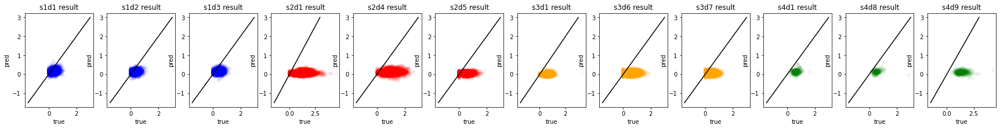

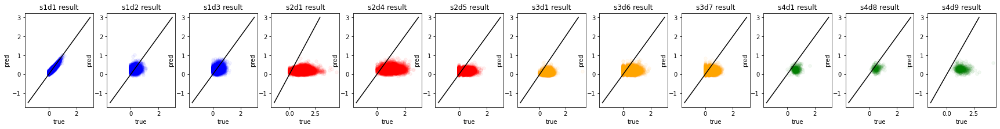

Training on dataset s1d2_emb


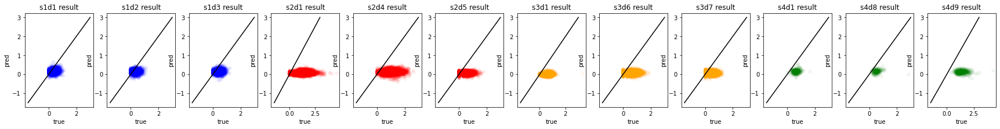

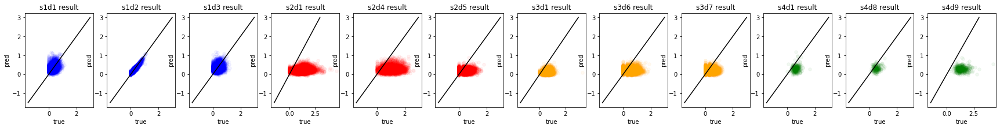

Training on dataset s1d3_emb


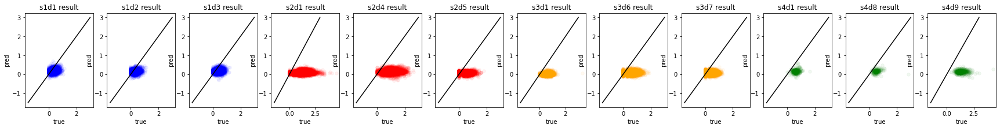

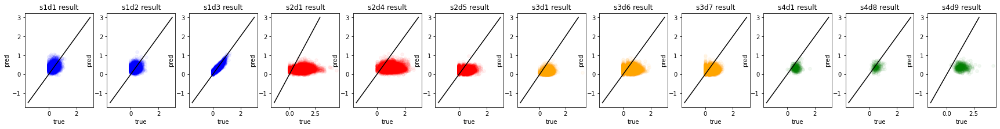

Training on dataset s2d1_emb


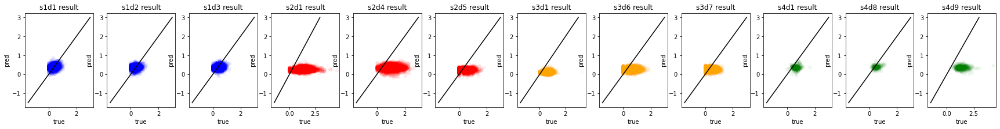

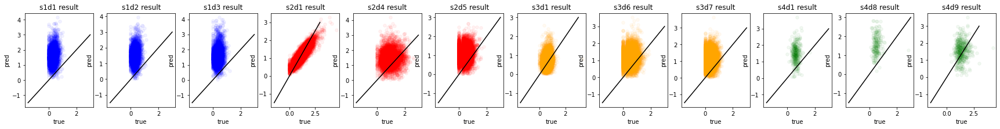

Training on dataset s2d4_emb


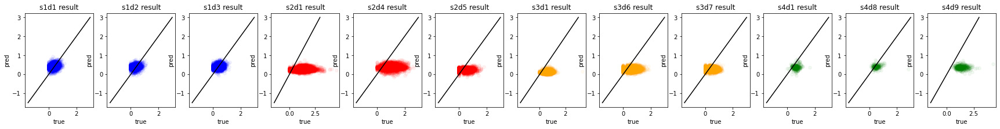

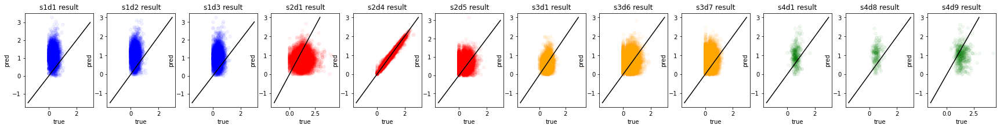

Training on dataset s2d5_emb


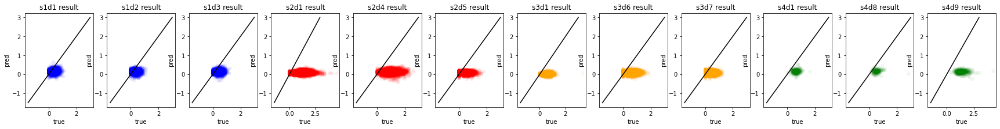

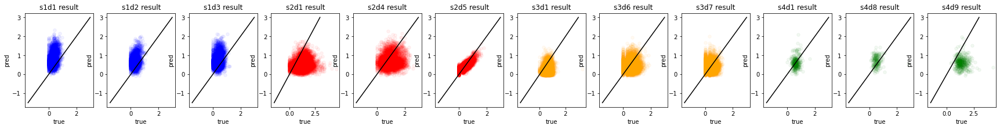

Training on dataset s3d1_emb


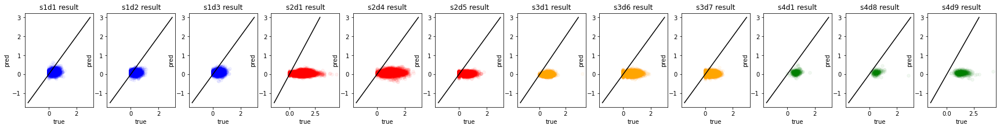

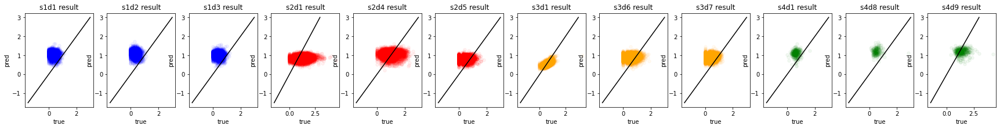

Training on dataset s3d6_emb


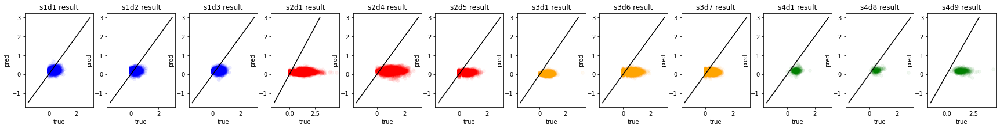

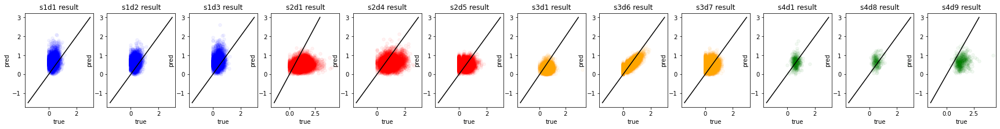

Training on dataset s3d7_emb


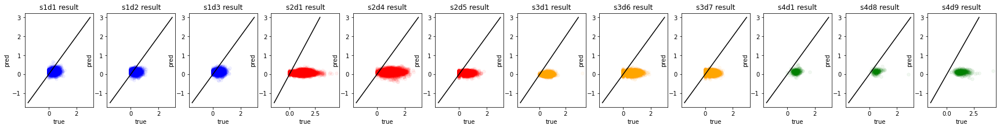

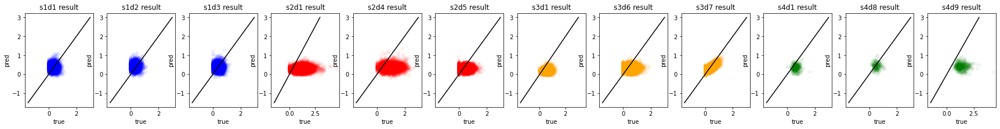

In [37]:
for i in range(len(RNA_dataset)):
    print('Training on dataset ' + emb_folder_names[i])
    # num_epochs = 2001
    learning_rate = 0.001
    latent_dim = 50
    loss_fn = F.mse_loss
    batch_size = 50000

    def seed_everything(seed=1234):
        random.seed(seed)
        os.environ['PYTHONHASHSEED'] = str(seed)
        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.backends.cudnn.deterministic = True

    seed_everything()

    model = Autoencoder()
    # model.load_state_dict(torch.load('Batch_feature_norm_model'))
    model = model.to(device)
    opt = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
    fit(num_epochs, model, loss_fn, RNA_dataset[i], pro_dataset[i], emb_folder_names[i], i)

In [38]:
filehandler = open('losses.pickle', "wb")
pickle.dump(losses, filehandler)
filehandler.close()

In [39]:
from matplotlib import animation
from IPython.display import HTML

video = (losses-np.min(losses))/(np.max(losses)-np.min(losses))

video = np.expand_dims(video, axis=3)
# np array with shape (frames, height, width, channels)
video = np.transpose(video, (2, 0, 1, 3))
video = video[:300, :, :, :]

fig = plt.figure(figsize=(8, 6))
im = plt.imshow(video[0,:,:,:])
plt.colorbar()

plt.close() # this is required to not display the generated image

def init():
    im.set_data(video[0,:,:,:])

def animate(i):
    im.set_data(video[i,:,:,:])
    return im

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=video.shape[0], interval=200)
HTML(anim.to_html5_video())

In [39]:
emb_folder_names = ['s1d1_emb', 's1d2_emb', 's1d3_emb', 's2d1_emb', 's2d4_emb', 's2d5_emb', 's3d1_emb', 's3d6_emb', 's3d7_emb']
dataset_names = ['s1d1', 's1d2', 's1d3', 's2d1', 's2d4', 's2d5', 's3d1', 's3d6', 's3d7', 's4d1', 's4d8', 's4d9']

Embeddings are each batch embedding corresponding to each model built from each training dataset

In [51]:
embeddings = []

for i in range(len(emb_folder_names)):
    emb_temp = []
    for j in range(len(dataset_names)):
        file = open(emb_folder_names[i] + '/' + dataset_names[j] + '.pickle', 'rb')
        emb = pickle.load(file)
        emb_temp.append(emb)
        file.close()
    embeddings.append(emb_temp)

In [52]:
def top_samples(source, target, num):
    distances = LA.norm(source-target, axis=1)
    temp_list = []
    for i in range(len(distances)):
        temp_list.append([distances[i], i])
    temp_list.sort()
    return [ele[1] for ele in temp_list[:num]]

Nearest neighbors of train dataset corresponding to each cell in each dataset
For example, using s1d1 as train, s1d2 as source dataset, number of neighbors is 10*number of cells in s1d2, these neighbors from s1d1
Data saved in embedding

In [43]:
neighbors = []

for k in tqdm(range(len(embeddings))):
    neighbors_temp = []
    for j in range(len(embeddings[k])):
        neighbors_list = []
        for i in range(embeddings[k][j].shape[0]):
            near_neig_ind = top_samples(embeddings[k][j][i], embeddings[k][k], 10)
            neighbors_list.append(embeddings[k][k][near_neig_ind])
        neighbors_ = np.concatenate(neighbors_list, axis= 0)
        neighbors_temp.append(neighbors_)
    neighbors.append(neighbors_temp)

100%|██████████| 9/9 [1:53:14<00:00, 754.99s/it]


In [45]:
filehandler = open('neighbors' + '.pickle', "wb")
pickle.dump(neighbors, filehandler)
filehandler.close()

In [40]:
file = open('neighbors' + '.pickle', 'rb')
neighbors = pickle.load(file)
file.close()

In [41]:
batch_s1d1 = np.zeros((neighbors[0][0].shape[0], 1))+0
batch_s1d2 = np.zeros((neighbors[0][1].shape[0], 1))+1
batch_s1d3 = np.zeros((neighbors[0][2].shape[0], 1))+2
batch_s2d1 = np.zeros((neighbors[0][3].shape[0], 1))+3
batch_s2d4 = np.zeros((neighbors[0][4].shape[0], 1))+4
batch_s2d5 = np.zeros((neighbors[0][5].shape[0], 1))+5
batch_s3d1 = np.zeros((neighbors[0][6].shape[0], 1))+6
batch_s3d6 = np.zeros((neighbors[0][7].shape[0], 1))+7
batch_s3d7 = np.zeros((neighbors[0][8].shape[0], 1))+8
batch_s4d1 = np.zeros((neighbors[0][9].shape[0], 1))+9
batch_s4d8 = np.zeros((neighbors[0][10].shape[0], 1))+10
batch_s4d9 = np.zeros((neighbors[0][11].shape[0], 1))+11

In [42]:
batches_labels = np.concatenate([batch_s1d1, batch_s1d2, batch_s1d3, batch_s2d1, batch_s2d4, batch_s2d5, batch_s3d1, batch_s3d6, batch_s3d7, batch_s4d1, batch_s4d8, batch_s4d9], axis = 0)

In [43]:
batches_emb = np.concatenate([neighbors[0][0],neighbors[0][1],neighbors[0][2],neighbors[0][3],neighbors[0][4],neighbors[0][5],neighbors[0][6],neighbors[0][7],neighbors[0][8],neighbors[0][9],neighbors[0][10],neighbors[0][11]], axis = 0)

Embeddings based on train s1d1
Umap calculated based on each neighbors embeddings individually
Umap representation of each dataset neighbors

/home/ubuntu/.local/lib/python3.8/site-packages/umap/spectral.py:260: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/ubuntu/.local/lib/python3.8/site-packages/umap/spectral.py:260: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/ubuntu/.local/lib/python3.8/site-packages/umap/spectral.py:260: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/ubuntu/.local/lib/python3.8/site-packages/umap/spectral.py:260: UserWarning: WARNING: spectral in

Constructing graphs finished in 0.3772716899197237 hrs


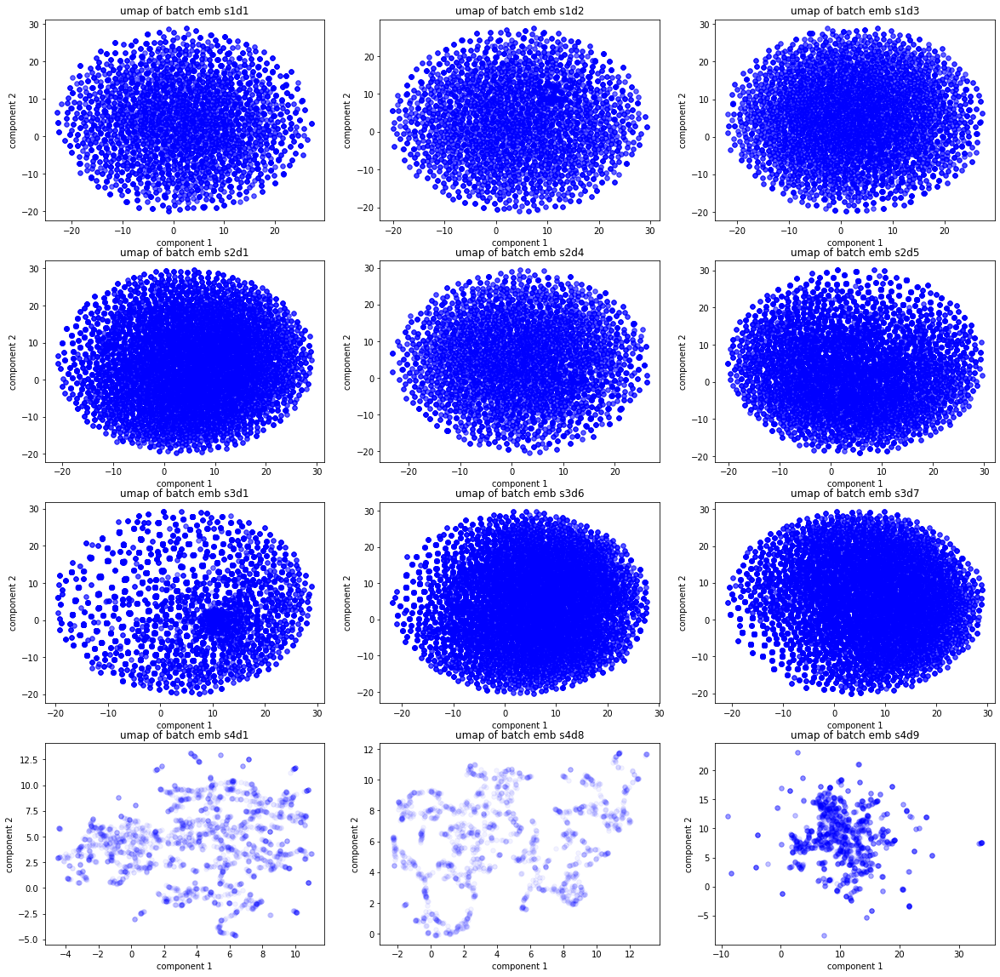

In [44]:
# start = time.perf_counter()
# umap_n_15 = []
# fit = umap.UMAP(n_neighbors = 15)
# figure, ax = plt.subplots(4, 3, figsize = (20, 20))
# ax = ax.flatten()
# for i in range(12):
#     emb_umap = fit.fit_transform(neighbors[0][i])
#     umap_n_15.append(emb_umap)
#     ax[i].scatter(emb_umap[:, 0], emb_umap[:, 1], c='blue', s = 30, alpha=0.05)
#     ax[i].set_title('umap of batch emb ' + dataset_names[i])
#     ax[i].set_xlabel('component 1')
#     ax[i].set_ylabel('component 2')
# end = time.perf_counter()
# print(f'Constructing graphs finished in {(end-start)/60/60} hrs')

In [45]:
# filehandler = open('umap_n_15.pickle', "wb")
# pickle.dump(umap_n_15, filehandler)
# filehandler.close()

Embeddings based on train s1d1
Umap calculated based on each dataset neighbors on s1d1
Umap representation of each dataset neighbors

/home/ubuntu/.local/lib/python3.8/site-packages/umap/spectral.py:260: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/ubuntu/.local/lib/python3.8/site-packages/umap/spectral.py:260: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/usr/local/lib/python3.8/dist-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Constructing graphs finished in 0.09610356412083396 hrs


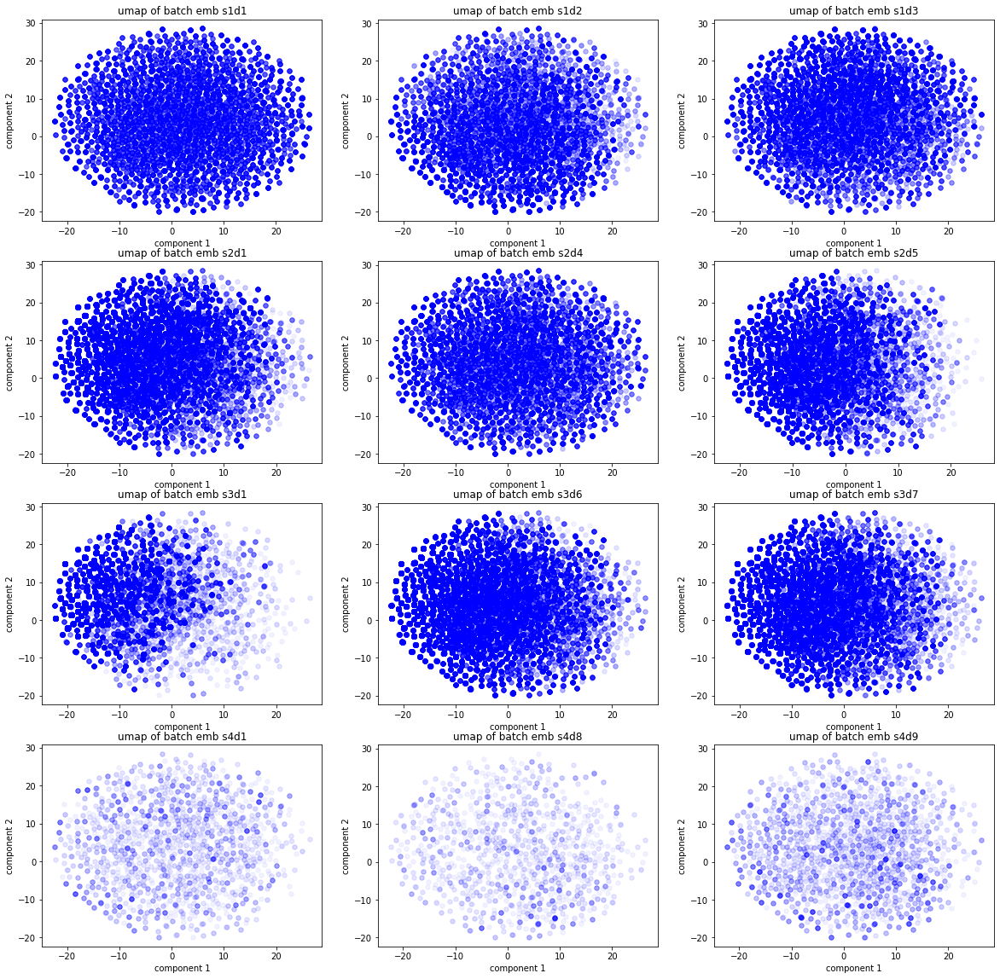

In [47]:
# start = time.perf_counter()
# umap_s1d1_n_15 = []
# fit = umap.UMAP(n_neighbors = 15)
# fit.fit(neighbors[0][0])
# figure, ax = plt.subplots(4, 3, figsize = (20, 20))
# ax = ax.flatten()
# for i in range(12):
#     emb_umap = fit.transform(neighbors[0][i])
#     umap_s1d1_n_15.append(emb_umap)
#     ax[i].scatter(emb_umap[:, 0], emb_umap[:, 1], c='blue', s = 30, alpha=0.05)
#     ax[i].set_title('umap of batch emb ' + dataset_names[i])
#     ax[i].set_xlabel('component 1')
#     ax[i].set_ylabel('component 2')
# end = time.perf_counter()
# print(f'Constructing graphs finished in {(end-start)/60/60} hrs')

In [48]:
# def top_samples(source, target, num):
#     distances = LA.norm(source-target, axis=1)
#     temp_list = []
#     for i in range(len(distances)):
#         temp_list.append([distances[i], i])
#     temp_list.sort()
#     return [ele[1] for ele in temp_list[:num]]

In [49]:
# neighbors = []

# for k in tqdm(range(len(embeddings))):
#     neighbors_temp = []
#     for j in range(len(embeddings[k])):
#         neighbors_list = []
#         for i in range(embeddings[k][j].shape[0]):
#             near_neig_ind = top_samples(embeddings[k][j][i], embeddings[k][k], 10)
#             neighbors_list.append(embeddings[k][k][near_neig_ind])
#         neighbors_ = np.concatenate(neighbors_list, axis= 0)
#         neighbors_temp.append(neighbors_)
#     neighbors.append(neighbors_temp)

Embeddings based on train s1d1
Umap calculated based on each dataset s1d1
Umap representation of each dataset

Constructing graphs finished in 0.027485084434722213 hrs


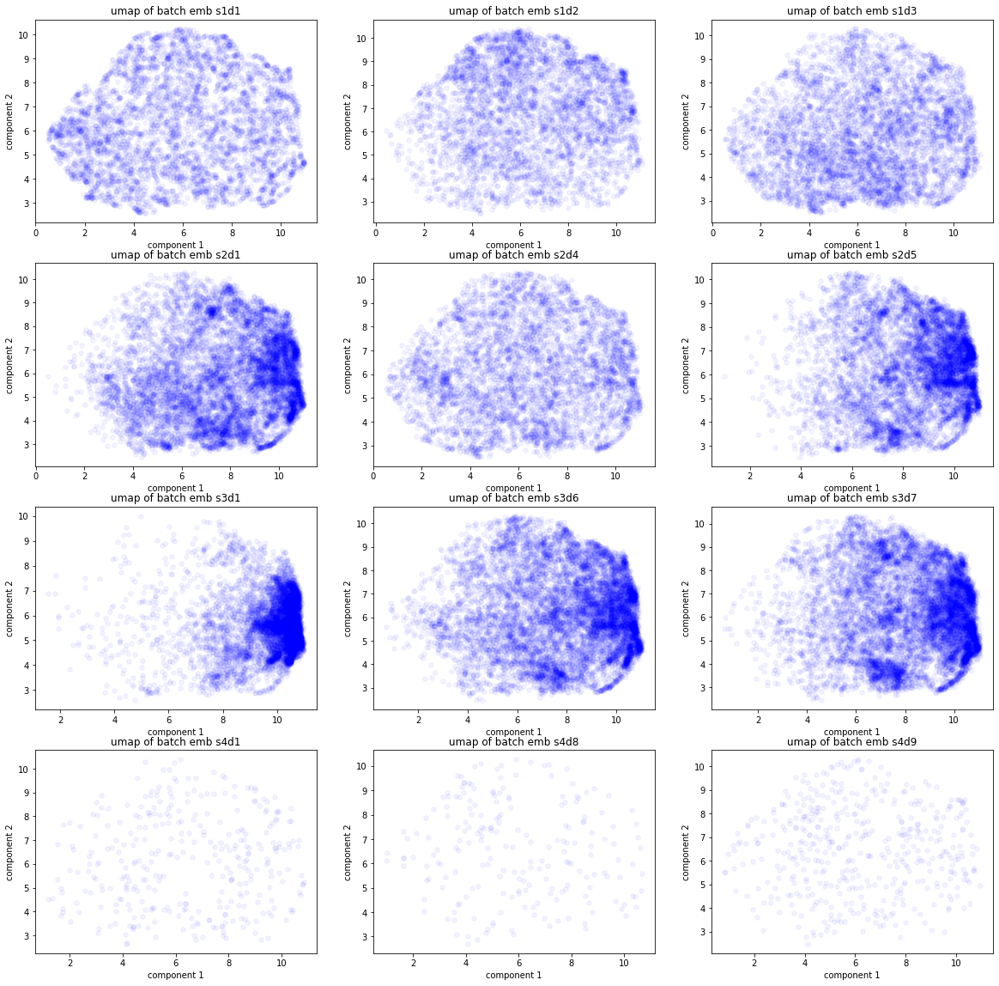

In [53]:
# start = time.perf_counter()

# fit = umap.UMAP(n_neighbors = 15)
# fit.fit(embeddings[0][0])
# figure, ax = plt.subplots(4, 3, figsize = (20, 20))
# ax = ax.flatten()
# for i in range(12):
#     emb_umap = fit.transform(embeddings[0][i])
#     ax[i].scatter(emb_umap[:, 0], emb_umap[:, 1], c='blue', s = 30, alpha=0.05)
#     ax[i].set_title('umap of batch emb ' + dataset_names[i])
#     ax[i].set_xlabel('component 1')
#     ax[i].set_ylabel('component 2')
# end = time.perf_counter()
# print(f'Constructing graphs finished in {(end-start)/60/60} hrs')

Embeddings based on train s1d2
Umap calculated based on each dataset s1d2
Umap representation of each dataset

Constructing graphs finished in 0.03275750956111248 hrs


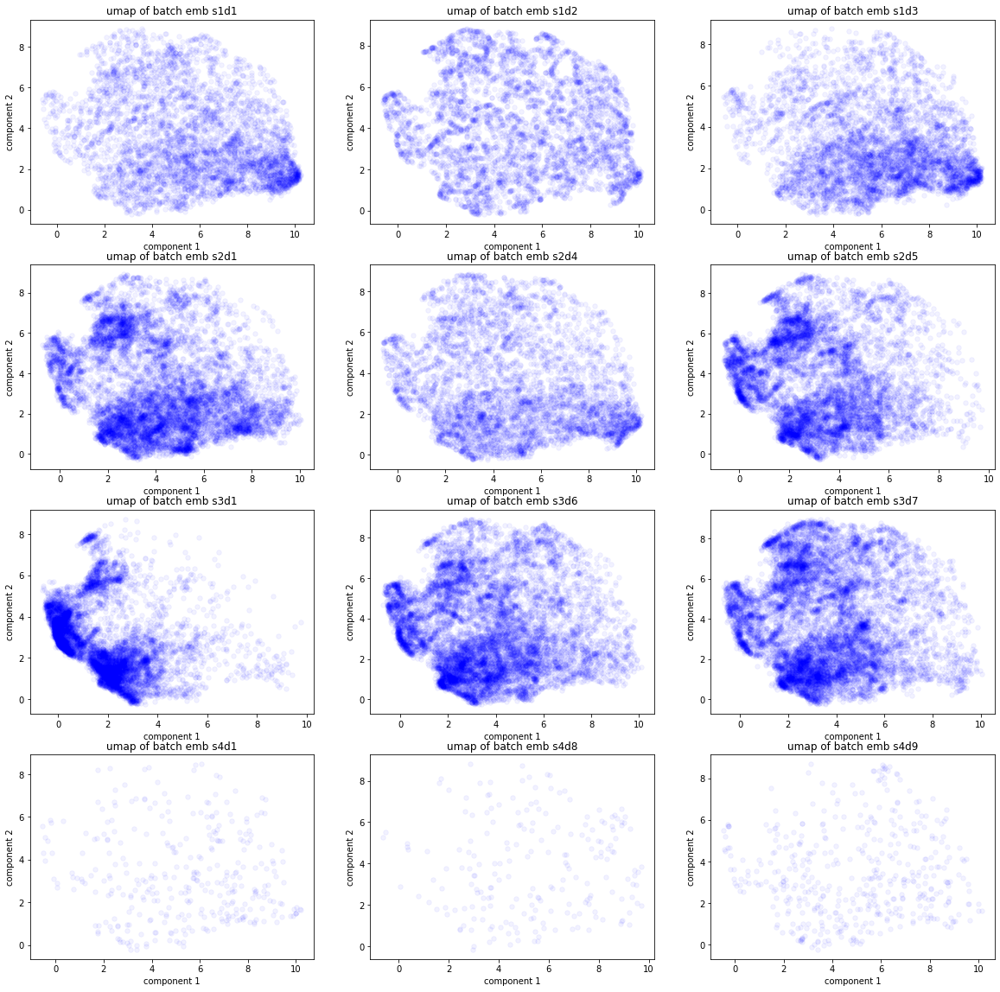

In [54]:
# start = time.perf_counter()

# fit = umap.UMAP(n_neighbors = 15)
# fit.fit(embeddings[1][1])
# figure, ax = plt.subplots(4, 3, figsize = (20, 20))
# ax = ax.flatten()
# for i in range(12):
#     emb_umap = fit.transform(embeddings[1][i])
#     ax[i].scatter(emb_umap[:, 0], emb_umap[:, 1], c='blue', s = 30, alpha=0.05)
#     ax[i].set_title('umap of batch emb ' + dataset_names[i])
#     ax[i].set_xlabel('component 1')
#     ax[i].set_ylabel('component 2')
# end = time.perf_counter()
# print(f'Constructing graphs finished in {(end-start)/60/60} hrs')

Embeddings based on train s1d3
Umap calculated based on each dataset s1d3
Umap representation of each dataset

Constructing graphs finished in 0.0353437482758333 hrs


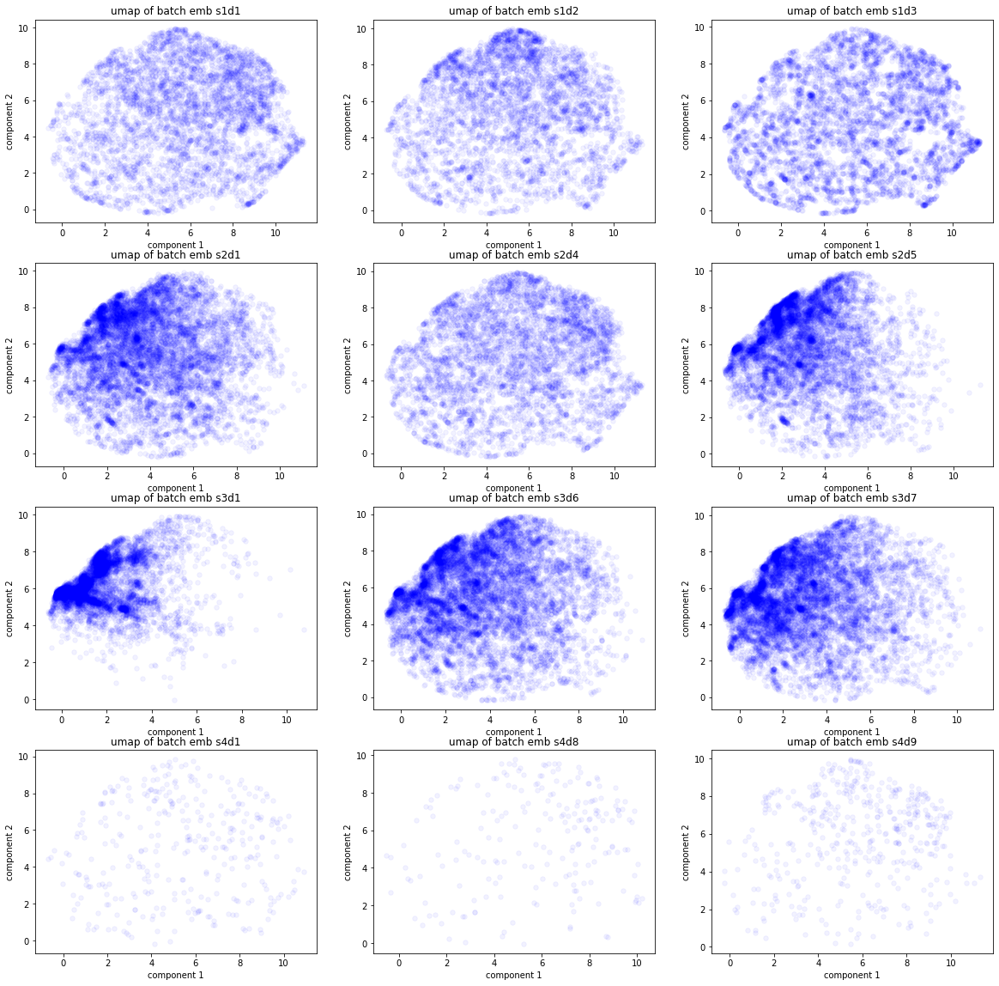

In [55]:
# start = time.perf_counter()

# fit = umap.UMAP(n_neighbors = 15)
# fit.fit(embeddings[2][2])
# figure, ax = plt.subplots(4, 3, figsize = (20, 20))
# ax = ax.flatten()
# for i in range(12):
#     emb_umap = fit.transform(embeddings[2][i])
#     ax[i].scatter(emb_umap[:, 0], emb_umap[:, 1], c='blue', s = 30, alpha=0.05)
#     ax[i].set_title('umap of batch emb ' + dataset_names[i])
#     ax[i].set_xlabel('component 1')
#     ax[i].set_ylabel('component 2')
# end = time.perf_counter()
# print(f'Constructing graphs finished in {(end-start)/60/60} hrs')

Embeddings based on train s2d1
Umap calculated based on each dataset s2d1
Umap representation of each dataset

Constructing graphs finished in 0.03269741230888839 hrs


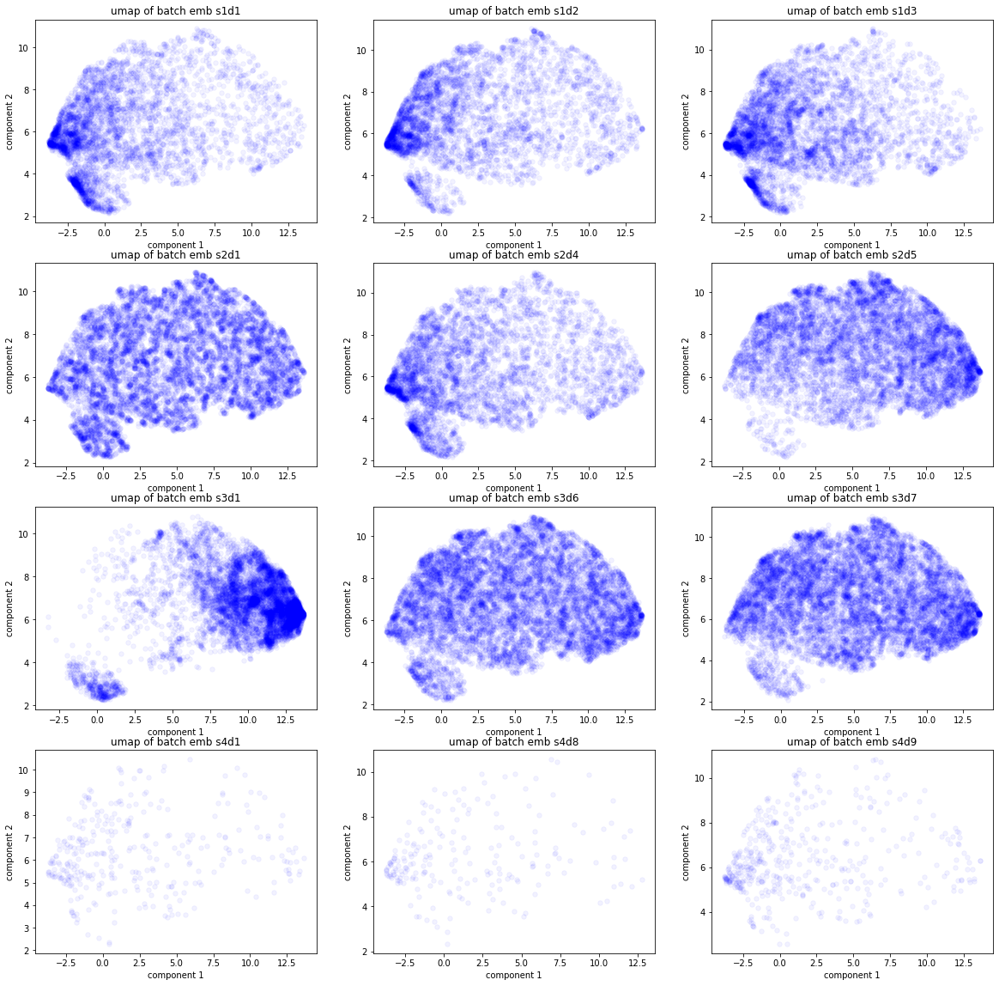

In [56]:
# start = time.perf_counter()

# fit = umap.UMAP(n_neighbors = 15)
# fit.fit(embeddings[3][3])
# figure, ax = plt.subplots(4, 3, figsize = (20, 20))
# ax = ax.flatten()
# for i in range(12):
#     emb_umap = fit.transform(embeddings[3][i])
#     ax[i].scatter(emb_umap[:, 0], emb_umap[:, 1], c='blue', s = 30, alpha=0.05)
#     ax[i].set_title('umap of batch emb ' + dataset_names[i])
#     ax[i].set_xlabel('component 1')
#     ax[i].set_ylabel('component 2')
# end = time.perf_counter()
# print(f'Constructing graphs finished in {(end-start)/60/60} hrs')

Embeddings based on train s2d4
Umap calculated based on each dataset s2d4
Umap representation of each dataset

Constructing graphs finished in 0.03589686152944423 hrs


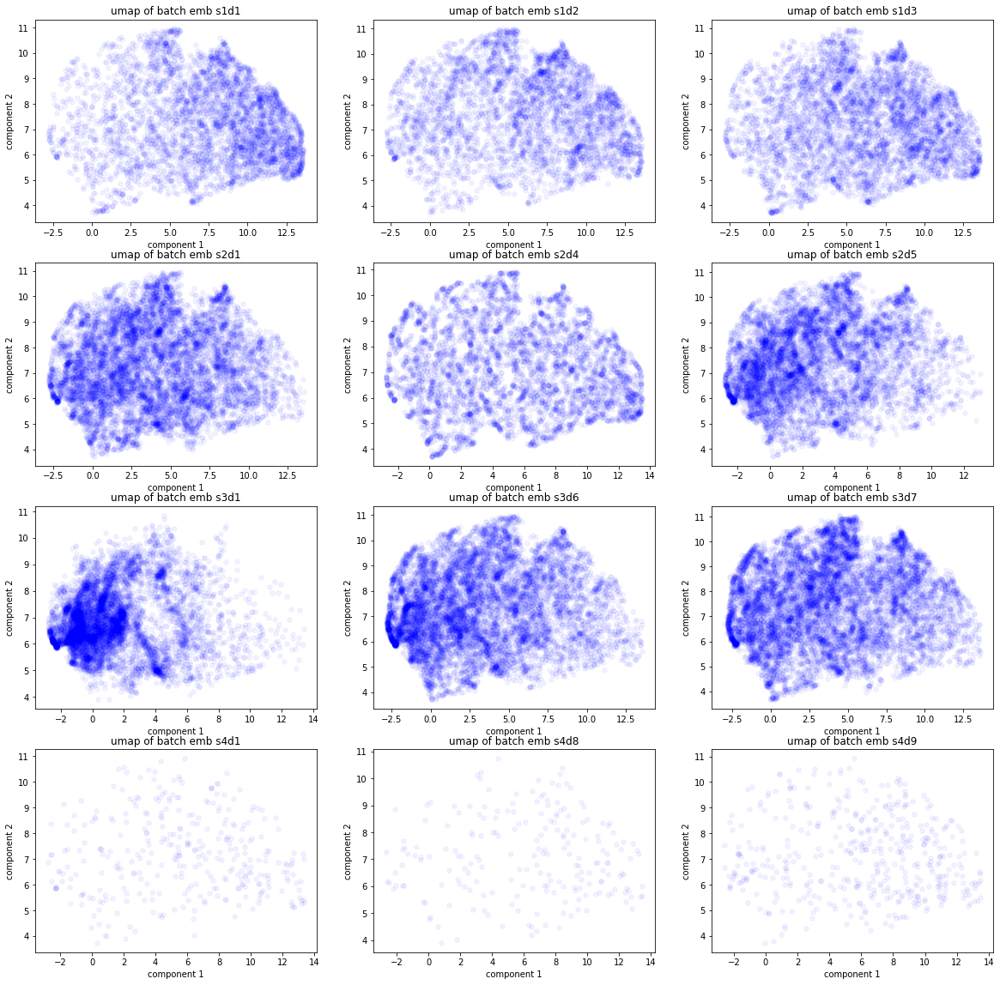

In [57]:
# start = time.perf_counter()

# fit = umap.UMAP(n_neighbors = 15)
# fit.fit(embeddings[4][4])
# figure, ax = plt.subplots(4, 3, figsize = (20, 20))
# ax = ax.flatten()
# for i in range(12):
#     emb_umap = fit.transform(embeddings[4][i])
#     ax[i].scatter(emb_umap[:, 0], emb_umap[:, 1], c='blue', s = 30, alpha=0.05)
#     ax[i].set_title('umap of batch emb ' + dataset_names[i])
#     ax[i].set_xlabel('component 1')
#     ax[i].set_ylabel('component 2')
# end = time.perf_counter()
# print(f'Constructing graphs finished in {(end-start)/60/60} hrs')

Embeddings based on train s2d5
Umap calculated based on each dataset s2d5
Umap representation of each dataset

Constructing graphs finished in 0.03414195137944464 hrs


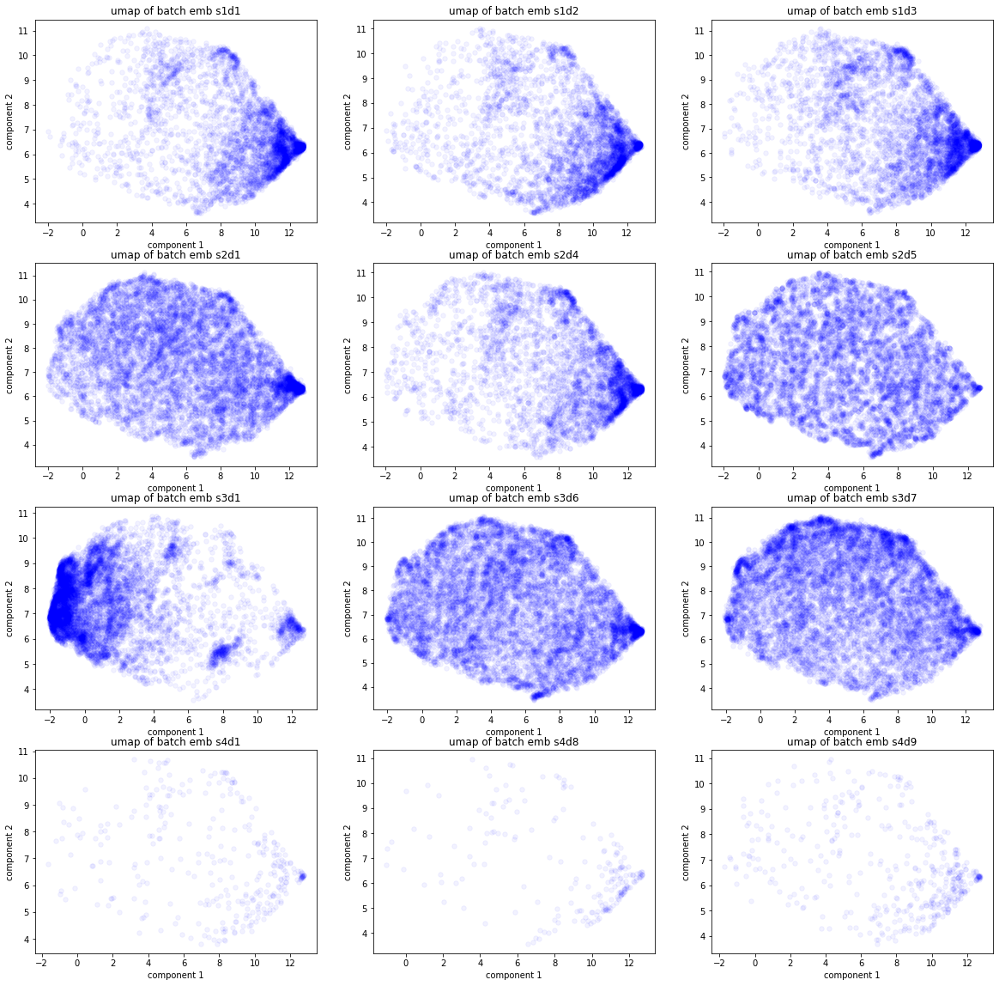

In [58]:
# start = time.perf_counter()

# fit = umap.UMAP(n_neighbors = 15)
# fit.fit(embeddings[5][5])
# figure, ax = plt.subplots(4, 3, figsize = (20, 20))
# ax = ax.flatten()
# for i in range(12):
#     emb_umap = fit.transform(embeddings[5][i])
#     ax[i].scatter(emb_umap[:, 0], emb_umap[:, 1], c='blue', s = 30, alpha=0.05)
#     ax[i].set_title('umap of batch emb ' + dataset_names[i])
#     ax[i].set_xlabel('component 1')
#     ax[i].set_ylabel('component 2')
# end = time.perf_counter()
# print(f'Constructing graphs finished in {(end-start)/60/60} hrs')

Embeddings based on train s3d1
Umap calculated based on each dataset s3d1
Umap representation of each dataset

Constructing graphs finished in 0.033699472027498505 hrs


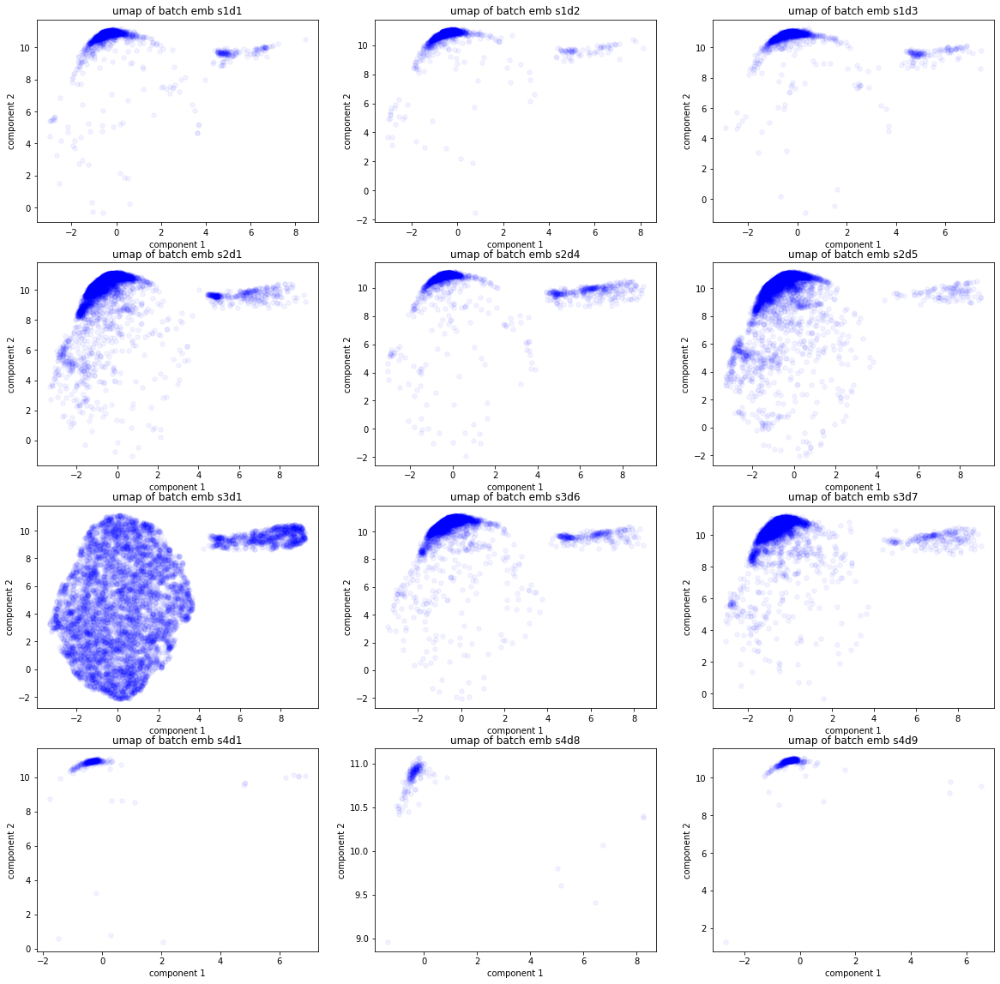

In [59]:
# start = time.perf_counter()

# fit = umap.UMAP(n_neighbors = 15)
# fit.fit(embeddings[6][6])
# figure, ax = plt.subplots(4, 3, figsize = (20, 20))
# ax = ax.flatten()
# for i in range(12):
#     emb_umap = fit.transform(embeddings[6][i])
#     ax[i].scatter(emb_umap[:, 0], emb_umap[:, 1], c='blue', s = 30, alpha=0.05)
#     ax[i].set_title('umap of batch emb ' + dataset_names[i])
#     ax[i].set_xlabel('component 1')
#     ax[i].set_ylabel('component 2')
# end = time.perf_counter()
# print(f'Constructing graphs finished in {(end-start)/60/60} hrs')

Embeddings based on train s3d6
Umap calculated based on each dataset s3d6
Umap representation of each dataset

Constructing graphs finished in 0.0367209938699994 hrs


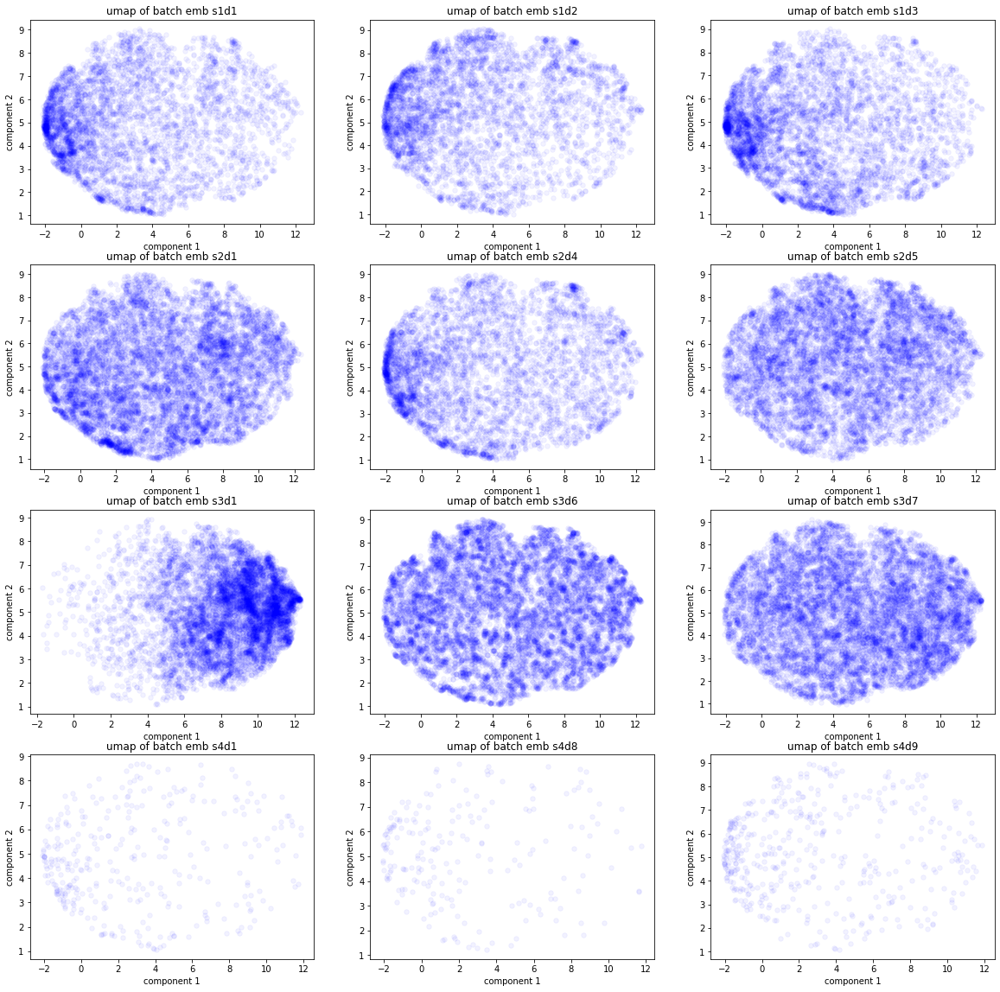

In [61]:
# start = time.perf_counter()

# fit = umap.UMAP(n_neighbors = 15)
# fit.fit(embeddings[7][7])
# figure, ax = plt.subplots(4, 3, figsize = (20, 20))
# ax = ax.flatten()
# for i in range(12):
#     emb_umap = fit.transform(embeddings[7][i])
#     ax[i].scatter(emb_umap[:, 0], emb_umap[:, 1], c='blue', s = 30, alpha=0.05)
#     ax[i].set_title('umap of batch emb ' + dataset_names[i])
#     ax[i].set_xlabel('component 1')
#     ax[i].set_ylabel('component 2')
# end = time.perf_counter()
# print(f'Constructing graphs finished in {(end-start)/60/60} hrs')

Embeddings based on train s3d7
Umap calculated based on each dataset s3d7
Umap representation of each dataset

Constructing graphs finished in 0.032403375152498484 hrs


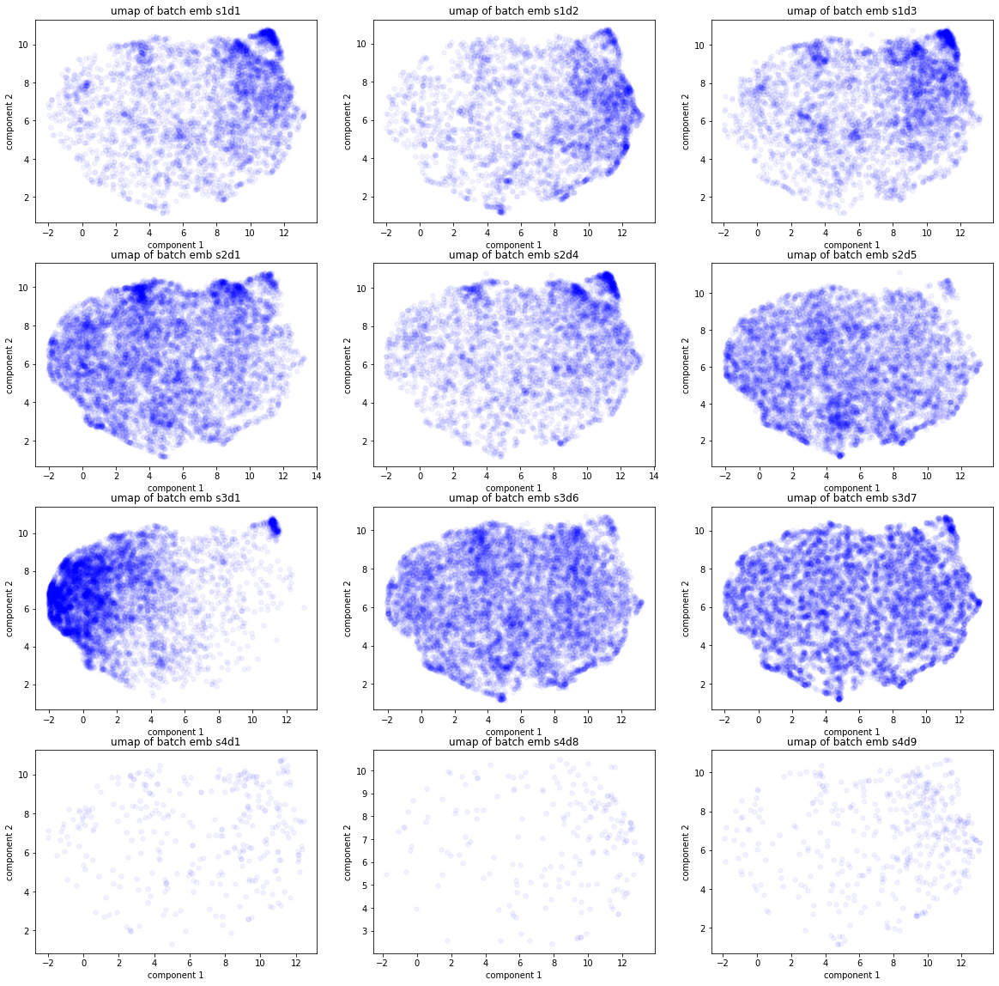

In [62]:
# start = time.perf_counter()

# fit = umap.UMAP(n_neighbors = 15)
# fit.fit(embeddings[8][8])
# figure, ax = plt.subplots(4, 3, figsize = (20, 20))
# ax = ax.flatten()
# for i in range(12):
#     emb_umap = fit.transform(embeddings[8][i])
#     ax[i].scatter(emb_umap[:, 0], emb_umap[:, 1], c='blue', s = 30, alpha=0.05)
#     ax[i].set_title('umap of batch emb ' + dataset_names[i])
#     ax[i].set_xlabel('component 1')
#     ax[i].set_ylabel('component 2')
# end = time.perf_counter()
# print(f'Constructing graphs finished in {(end-start)/60/60} hrs')

In [ ]:
predictions = []

for i in range(len(emb_folder_names)):
    emb_temp = []
    for j in range(len(dataset_names)):
        file = open(emb_folder_names[i] + '/' + dataset_names[j] + '.pickle', 'rb')
        emb = pickle.load(file)
        emb_temp.append(emb)
        file.close()
    embeddings.append(emb_temp)

Embedding UMAP analysis based on batch s1d1 model

In [78]:
batches_embeddings = np.concatenate([embeddings[0][0],embeddings[0][1],embeddings[0][2],embeddings[0][3],embeddings[0][4],embeddings[0][5],embeddings[0][6],embeddings[0][7],embeddings[0][8],embeddings[0][9],embeddings[0][10],embeddings[0][11]], axis = 0)
batches_labels = np.concatenate([np.zeros((len(RNA_s1d1), 1)), np.zeros((len(RNA_s1d2), 1))+1, np.zeros((len(RNA_s1d3), 1))+2, np.zeros((len(RNA_s2d1), 1))+3, np.zeros((len(RNA_s2d4), 1))+4, np.zeros((len(RNA_s2d5), 1))+5, np.zeros((len(RNA_s3d1), 1))+6, np.zeros((len(RNA_s3d6), 1))+7, np.zeros((len(RNA_s3d7), 1))+8, np.zeros((len(RNA_s4d1), 1))+9, np.zeros((len(RNA_s4d8), 1))+10, np.zeros((len(RNA_s4d9), 1))+11], axis = 0)

In [79]:
batches_labels = batches_labels.astype(int)
batches_labels = np.squeeze(batches_labels)
batches_labels = batches_labels.tolist()

In [80]:
colors = ['red','green','blue','purple', 'yellow', 'orange']

In [81]:
part_1_batches = len(RNA_s1d1)+len(RNA_s1d2)+len(RNA_s1d3)+len(RNA_s2d1)+len(RNA_s2d1)+len(RNA_s2d1)

In [82]:
s1d1_start = 0
s1d1_end = s1d1_start + len(RNA_s1d1)

s1d2_start = s1d1_end
s1d2_end = s1d2_start + len(RNA_s1d2)

s1d3_start = s1d2_end
s1d3_end = s1d3_start + len(RNA_s1d3)

s2d1_start = s1d3_end
s2d1_end = s2d1_start + len(RNA_s2d1)

s2d4_start = s2d1_end
s2d4_end = s2d4_start + len(RNA_s2d4)

s2d5_start = s2d4_end
s2d5_end = s2d5_start + len(RNA_s2d5)

s3d1_start = s2d5_end
s3d1_end = s3d1_start + len(RNA_s3d1)

s3d6_start = s3d1_end
s3d6_end = s3d6_start + len(RNA_s3d6)

s3d7_start = s3d6_end
s3d7_end = s3d7_start + len(RNA_s3d7)

s4d1_start = s3d7_end
s4d1_end = s4d1_start + len(RNA_s4d1)

s4d8_start = s4d1_end
s4d8_end = s4d8_start + len(RNA_s4d8)

s4d9_start = s4d8_end
s4d9_end = s4d9_start + len(RNA_s4d9)

In [83]:
batches_start = [s1d1_start, s1d2_start, s1d3_start, s2d1_start, s2d4_start, s2d5_start, s3d1_start, s3d6_start, s3d7_start, s4d1_start, s4d8_start, s4d9_start]
batches_end = [s1d1_end, s1d2_end, s1d3_end, s2d1_end, s2d4_end, s2d5_end, s3d1_end, s3d6_end, s3d7_end, s4d1_end, s4d8_end, s4d9_end]
batches = ['s1d1', 's1d2', 's1d3', 's2d1', 's2d4', 's2d5', 's3d1', 's3d6', 's3d7', 's4d1', 's4d8', 's4d9']

In [85]:
batches_embeddings.shape

(67175, 15)

Embeddings based on train s1d1
Umap calculated based on each dataset s1d1
Umap representation of each dataset

s1d1 train model embeddings
UMAP of all batches
Plot seperately

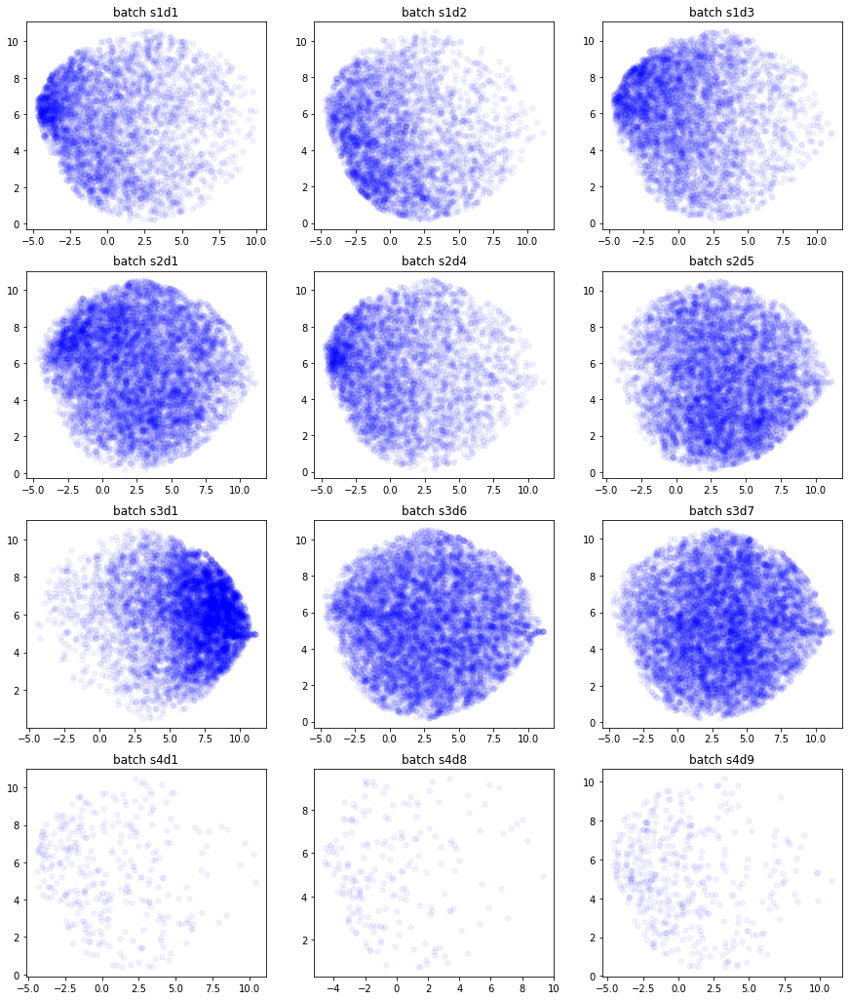

In [86]:
fit = umap.UMAP(n_neighbors = 15)
batches_emb_umap = fit.fit_transform(batches_embeddings)

batches_emb_umap_list = []

for i in range(len(batches_start)):
    batches_emb_umap_list.append([batches_emb_umap[batches_start[i]:batches_end[i], 0], batches_emb_umap[batches_start[i]:batches_end[i], 1]])

figure, ax = plt.subplots(4, 3, figsize = (15, 18))
ax = ax.flatten()
for i in range(12):
    ax[i].scatter(batches_emb_umap_list[i][0], batches_emb_umap_list[i][1], c='blue', s = 30, alpha=0.05)
    ax[i].set_title('batch ' + batches[i])

In [87]:
import numpy as np
from sklearn import metrics


def mmd_linear(X, Y):
    """MMD using linear kernel (i.e., k(x,y) = <x,y>)
    Note that this is not the original linear MMD, only the reformulated and faster version.
    The original version is:
        def mmd_linear(X, Y):
            XX = np.dot(X, X.T)
            YY = np.dot(Y, Y.T)
            XY = np.dot(X, Y.T)
            return XX.mean() + YY.mean() - 2 * XY.mean()
    Arguments:
        X {[n_sample1, dim]} -- [X matrix]
        Y {[n_sample2, dim]} -- [Y matrix]
    Returns:
        [scalar] -- [MMD value]
    """
    delta = X.mean(0) - Y.mean(0)
    return delta.dot(delta.T)


def mmd_rbf(X, Y, gamma=1.0):
    """MMD using rbf (gaussian) kernel (i.e., k(x,y) = exp(-gamma * ||x-y||^2 / 2))
    Arguments:
        X {[n_sample1, dim]} -- [X matrix]
        Y {[n_sample2, dim]} -- [Y matrix]
    Keyword Arguments:
        gamma {float} -- [kernel parameter] (default: {1.0})
    Returns:
        [scalar] -- [MMD value]
    """
    XX = metrics.pairwise.rbf_kernel(X, X, gamma)
    YY = metrics.pairwise.rbf_kernel(Y, Y, gamma)
    XY = metrics.pairwise.rbf_kernel(X, Y, gamma)
    return XX.mean() + YY.mean() - 2 * XY.mean()


def mmd_poly(X, Y, degree=2, gamma=1, coef0=0):
    """MMD using polynomial kernel (i.e., k(x,y) = (gamma <X, Y> + coef0)^degree)
    Arguments:
        X {[n_sample1, dim]} -- [X matrix]
        Y {[n_sample2, dim]} -- [Y matrix]
    Keyword Arguments:
        degree {int} -- [degree] (default: {2})
        gamma {int} -- [gamma] (default: {1})
        coef0 {int} -- [constant item] (default: {0})
    Returns:
        [scalar] -- [MMD value]
    """
    XX = metrics.pairwise.polynomial_kernel(X, X, degree, gamma, coef0)
    YY = metrics.pairwise.polynomial_kernel(Y, Y, degree, gamma, coef0)
    XY = metrics.pairwise.polynomial_kernel(X, Y, degree, gamma, coef0)
    return XX.mean() + YY.mean() - 2 * XY.mean()

In [89]:
loss_file = pd.read_csv('Batch_train_loss.csv')

loss matrix
row is training model of each train batch
column is testing of each batch

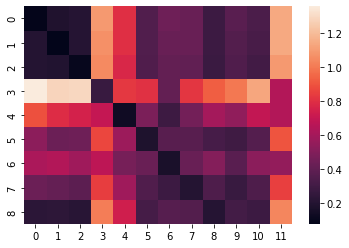

In [92]:
loss_matrix = loss_file.iloc[1:, 2:-1]
loss_matrix_np = np.array(loss_matrix)
loss_matrix_np = loss_matrix_np.astype(float)

ax = sns.heatmap(loss_matrix_np)

MMD distances between each batches
Based on each train batch model embedding

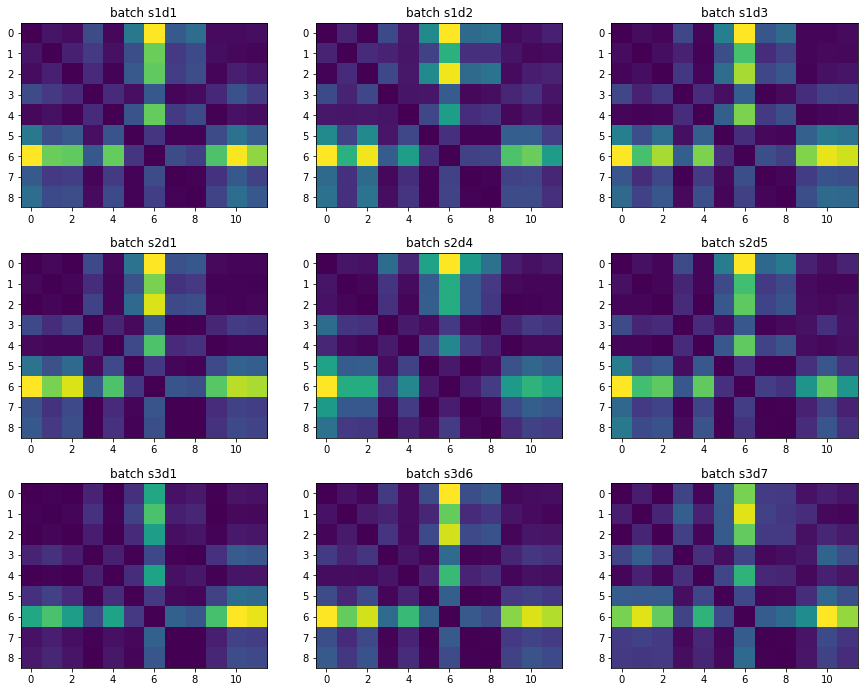

In [93]:
figure, ax = plt.subplots(3, 3, figsize = (15, 12))
ax = ax.flatten()
for k in range(9):
    mmd_linear_matrix = np.zeros((12, 12))
    for i in range(12):
        for j in range(12):
            mmd_linear_matrix[i][j] = mmd_linear(embeddings[k][i], embeddings[k][j])
    ax[k].imshow(mmd_linear_matrix[0:9])
    ax[k].grid(False)
    ax[k].set_title('batch ' + batches[k])

cosine similarity between each batche means 
Based on each train batch model embedding

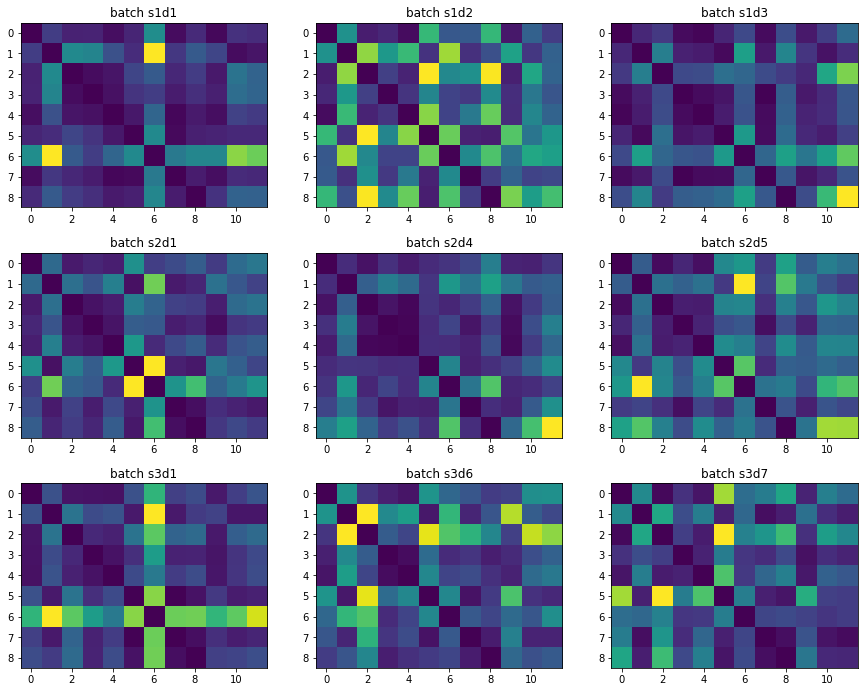

In [97]:
figure, ax = plt.subplots(3, 3, figsize = (15, 12))
ax = ax.flatten()
for k in range(9):
    embedding_means = np.zeros((12, 15))
    for i in range(12):
        embedding_means[i, :] = np.mean(embeddings[k][i], axis = 0)

    matrix = sklearn.metrics.pairwise.cosine_similarity(embedding_means, embedding_means)
    ax[k].imshow(1-matrix[0:9])    
    ax[k].grid(False)
    ax[k].set_title('batch ' + batches[k])